# Import libs

In [1]:
## Run code ###
# !pip install prophet

In [1]:
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.plot import plot_cross_validation_metric
import pandas as pd
from prophet.plot import plot_plotly,plot_components_plotly
import matplotlib.pyplot as plt

In [2]:
url = "/Users/sarthaksingh/code/Sarthak-Singh1996/Tobias-Neubert94/adam_monk_II/adam_monk_II/data/Price_Data_Updated.gzip"
df_price = pd.read_parquet(url)
df_price = df_price[['Ref_Date','Future Price']]

In [5]:
# df_lim = df_price[df_price['Ref_Date']<='2019-12-31']

In [6]:
# df_lim

In [7]:
# df_lim.info()

In [3]:
df_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4821 entries, 0 to 4820
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Ref_Date      4821 non-null   datetime64[ns]
 1   Future Price  4821 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 75.5 KB


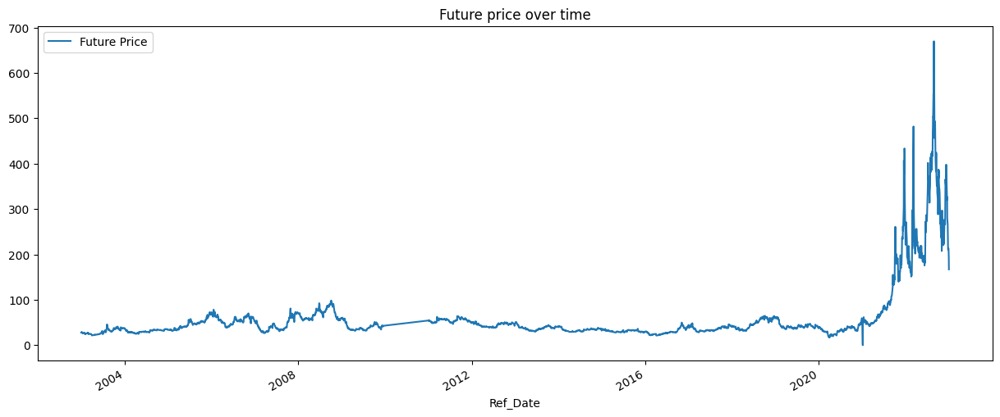

In [4]:
df_price.plot(x='Ref_Date', y='Future Price', figsize=(15,6), title="Future price over time");

In [10]:
# df_lim.plot(x='Ref_Date', y='Future Price', figsize=(15,6), title="Future price over time");

In [11]:
# df_lim.columns = ['ds','y']

In [5]:
df_price.columns = ['ds','y']

## From here we start our amazing Prophet ML model

In [6]:
test_price = df_price[df_price['ds']>='2022-01-01']

In [7]:
test_price

,ds,y
4564,2022-01-03,250.00
4565,2022-01-04,271.00
4566,2022-01-05,257.10
4567,2022-01-06,260.00
4568,2022-01-07,250.13
...,...,...
4816,2022-12-23,210.97
4817,2022-12-27,212.92
4818,2022-12-28,201.97
4819,2022-12-29,194.34


In [38]:
# df_lim = df_lim.iloc[:3799]

In [8]:
df_price

,ds,y
0,2003-01-02,27.63
1,2003-01-03,27.70
2,2003-01-06,29.32
3,2003-01-07,28.25
4,2003-01-08,28.05
...,...,...
4816,2022-12-23,210.97
4817,2022-12-27,212.92
4818,2022-12-28,201.97
4819,2022-12-29,194.34


In [89]:
# df_lim

In [9]:
model = Prophet(daily_seasonality=True)

In [10]:
model.fit(df_price)

20:18:24 - cmdstanpy - INFO - Chain [1] start processing
20:18:26 - cmdstanpy - INFO - Chain [1] done processing


In [40]:
# model.fit(df_lim)

19:55:58 - cmdstanpy - INFO - Chain [1] start processing
19:55:59 - cmdstanpy - INFO - Chain [1] done processing


## Forecasting

In [11]:
forecast = model.predict(test_lim[['ds']])
forecast

NameError: name 'test_lim' is not defined

In [93]:
forecast['yhat']

0      200.549619
1      200.828375
2      201.006132
3      201.333147
4      201.000983
          ...    
252    283.116454
253    281.217168
254    280.923379
255    280.737889
256    279.867330
Name: yhat, Length: 257, dtype: float64

In [12]:
plot_plotly(model,forecast)

NameError: name 'forecast' is not defined

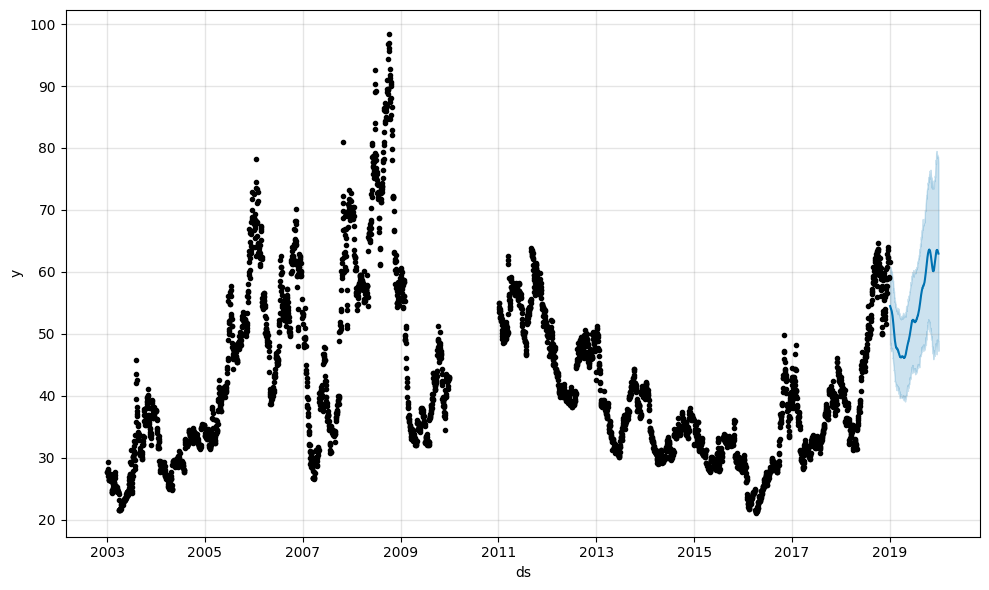

In [49]:
# model.plot(forecast);

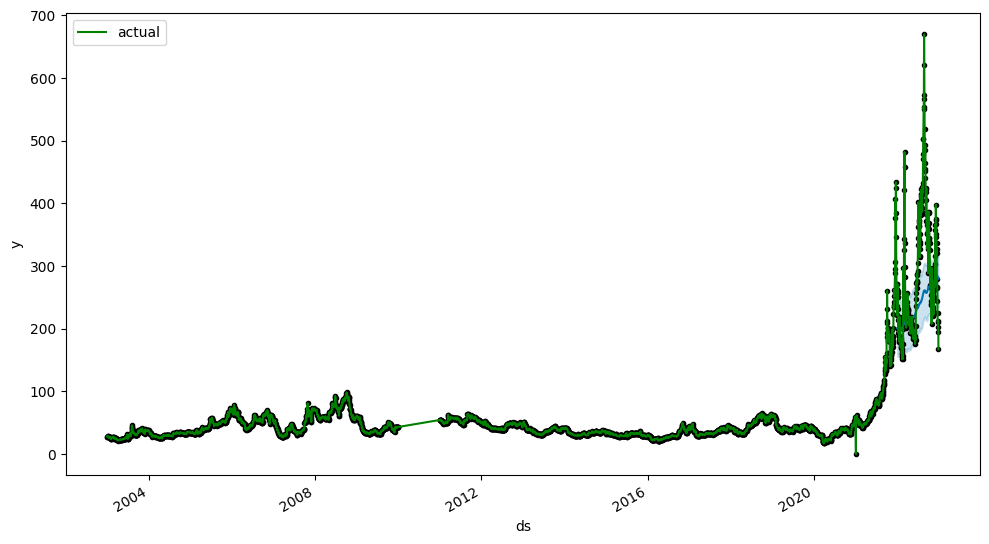

In [95]:
ax = model.plot(forecast).gca()
df_price.plot(ax=ax, x='ds', y='y', label='actual', color='g');

## Calculating residuals

In [96]:
residuals = forecast['yhat'].values - test_lim['y'].values
pd.DataFrame(residuals)

,0
0,-49.450381
1,-70.171625
2,-56.093868
3,-58.666853
4,-49.129017
...,...
252,72.146454
253,68.297168
254,78.953379
255,86.397889


## Future predictions

In [50]:
# df_lim

In [97]:
future = model.make_future_dataframe(freq='D', periods=24*30)
future

,ds
0,2003-01-02
1,2003-01-03
2,2003-01-06
3,2003-01-07
4,2003-01-08
...,...
5536,2024-12-15
5537,2024-12-16
5538,2024-12-17
5539,2024-12-18


In [98]:
future_forecast = model.predict(future)
future_forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2003-01-02,26.821775,-16.499446,74.990119,26.821775,26.821775,1.652386,1.652386,1.652386,-2.016963,...,0.289415,0.289415,0.289415,3.379933,3.379933,3.379933,0.0,0.0,0.0,28.474161
1,2003-01-03,26.842213,-16.433943,70.589830,26.842213,26.842213,0.809586,0.809586,0.809586,-2.016963,...,-0.177341,-0.177341,-0.177341,3.003889,3.003889,3.003889,0.0,0.0,0.0,27.651799
2,2003-01-06,26.903527,-17.019128,68.757157,26.903527,26.903527,-0.211330,-0.211330,-0.211330,-2.016963,...,-0.499633,-0.499633,-0.499633,2.305265,2.305265,2.305265,0.0,0.0,0.0,26.692197
3,2003-01-07,26.923965,-13.322072,70.428855,26.923965,26.923965,0.045769,0.045769,0.045769,-2.016963,...,-0.147801,-0.147801,-0.147801,2.210532,2.210532,2.210532,0.0,0.0,0.0,26.969734
4,2003-01-08,26.944403,-16.596359,68.760694,26.944403,26.944403,0.191595,0.191595,0.191595,-2.016963,...,0.031119,0.031119,0.031119,2.177439,2.177439,2.177439,0.0,0.0,0.0,27.135998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5536,2024-12-15,429.908967,385.566827,491.274285,396.037327,458.470940,11.022863,11.022863,11.022863,-2.016963,...,0.252120,0.252120,0.252120,12.787706,12.787706,12.787706,0.0,0.0,0.0,440.931830
5537,2024-12-16,430.122304,379.360656,491.198013,396.187006,458.735550,10.124664,10.124664,10.124664,-2.016963,...,-0.499633,-0.499633,-0.499633,12.641260,12.641260,12.641260,0.0,0.0,0.0,440.246968
5538,2024-12-17,430.335640,380.438531,491.804471,396.336685,459.000160,10.233093,10.233093,10.233093,-2.016963,...,-0.147801,-0.147801,-0.147801,12.397856,12.397856,12.397856,0.0,0.0,0.0,440.568733
5539,2024-12-18,430.548977,385.557589,493.993414,396.486364,459.263607,10.076897,10.076897,10.076897,-2.016963,...,0.031119,0.031119,0.031119,12.062740,12.062740,12.062740,0.0,0.0,0.0,440.625874


In [99]:
plot_plotly(model,future_forecast)

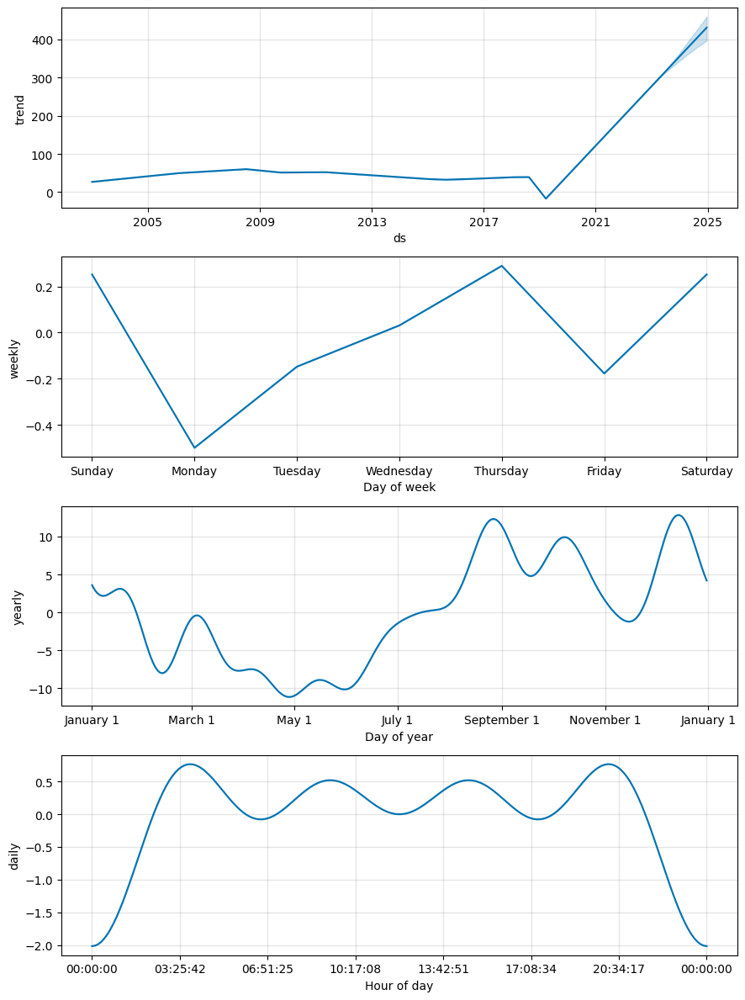

In [100]:
model.plot_components(future_forecast);

In [101]:
df_cv = cross_validation(model, period='180 days', horizon='365 days')

  0%|          | 0/33 [00:00<?, ?it/s]

22:22:19 - cmdstanpy - INFO - Chain [1] start processing
22:22:20 - cmdstanpy - INFO - Chain [1] done processing
22:22:20 - cmdstanpy - INFO - Chain [1] start processing
22:22:20 - cmdstanpy - INFO - Chain [1] done processing
22:22:20 - cmdstanpy - INFO - Chain [1] start processing
22:22:20 - cmdstanpy - INFO - Chain [1] done processing
22:22:20 - cmdstanpy - INFO - Chain [1] start processing
22:22:20 - cmdstanpy - INFO - Chain [1] done processing
22:22:20 - cmdstanpy - INFO - Chain [1] start processing
22:22:21 - cmdstanpy - INFO - Chain [1] done processing
22:22:21 - cmdstanpy - INFO - Chain [1] start processing
22:22:21 - cmdstanpy - INFO - Chain [1] done processing
22:22:21 - cmdstanpy - INFO - Chain [1] start processing
22:22:21 - cmdstanpy - INFO - Chain [1] done processing
22:22:22 - cmdstanpy - INFO - Chain [1] start processing
22:22:22 - cmdstanpy - INFO - Chain [1] done processing
22:22:22 - cmdstanpy - INFO - Chain [1] start processing
22:22:22 - cmdstanpy - INFO - Chain [1]

In [103]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2006-03-27,61.043974,57.327444,64.925003,50.17,2006-03-24
1,2006-03-28,61.216442,57.435521,65.144678,50.20,2006-03-24
2,2006-03-29,61.452101,57.422309,65.180607,50.87,2006-03-24
3,2006-03-30,61.603514,57.641814,65.468577,50.72,2006-03-24
4,2006-03-31,61.886055,57.769635,65.892390,49.59,2006-03-24
...,...,...,...,...,...,...
7845,2022-12-23,132.291009,103.773121,158.108997,210.97,2021-12-30
7846,2022-12-27,130.158915,103.653598,156.853768,212.92,2021-12-30
7847,2022-12-28,129.466662,101.408914,156.603793,201.97,2021-12-30
7848,2022-12-29,128.541626,102.491430,153.403631,194.34,2021-12-30


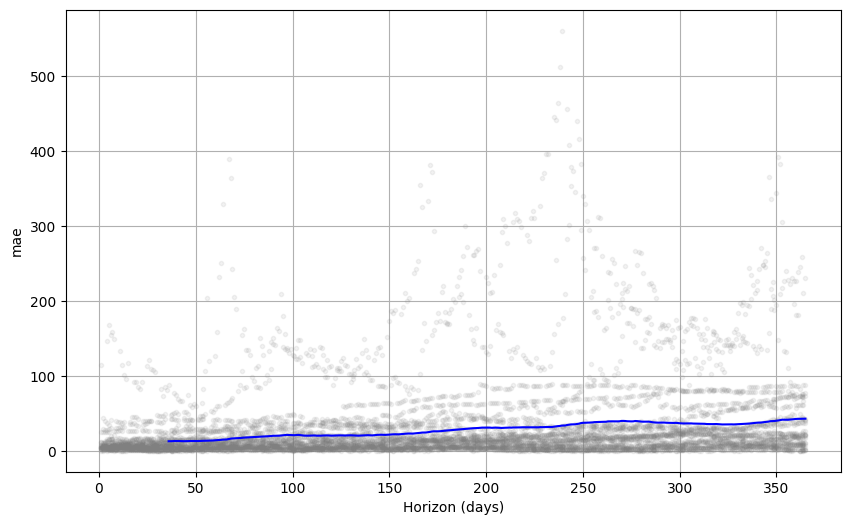

In [104]:
fig = plot_cross_validation_metric(df_cv, metric='mae')

### Creating Unknown data

In [13]:
# Creating unknown data for the model but we have that data to see how well our model is predicting
unknown_data = df_price.iloc[-100:]
data = df_price.iloc[:-100]

In [14]:
new_model = Prophet(daily_seasonality=True)
new_model.fit(data) 

20:23:37 - cmdstanpy - INFO - Chain [1] start processing
20:23:38 - cmdstanpy - INFO - Chain [1] done processing


In [15]:
future_dates = new_model.make_future_dataframe(freq='D', periods=24*30)
predictions = new_model.predict(future_dates)

In [16]:
plot_plotly(new_model,predictions)

### Comparing actual vs predictions

In [17]:
pred = predictions[predictions['ds'].isin(unknown_data['ds'])]

In [18]:
pred

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
4721,2022-08-12,197.051230,157.885292,237.240870,197.051230,197.051230,-0.950966,-0.950966,-0.950966,-2.043144,...,-0.202378,-0.202378,-0.202378,1.294556,1.294556,1.294556,0.0,0.0,0.0,196.100264
4724,2022-08-15,197.473029,156.392340,233.330033,197.473029,197.473029,-2.912201,-2.912201,-2.912201,-2.043144,...,-0.499978,-0.499978,-0.499978,-0.369080,-0.369080,-0.369080,0.0,0.0,0.0,194.560828
4725,2022-08-16,197.613629,157.659925,233.630294,197.613629,197.613629,-3.042821,-3.042821,-3.042821,-2.043144,...,-0.124821,-0.124821,-0.124821,-0.874856,-0.874856,-0.874856,0.0,0.0,0.0,194.570808
4726,2022-08-17,197.754229,157.241686,232.226433,197.754229,197.754229,-3.309690,-3.309690,-3.309690,-2.043144,...,0.077065,0.077065,0.077065,-1.343612,-1.343612,-1.343612,0.0,0.0,0.0,194.444539
4727,2022-08-18,197.894829,157.028805,233.014367,197.894829,197.894829,-3.573006,-3.573006,-3.573006,-2.043144,...,0.239325,0.239325,0.239325,-1.769188,-1.769188,-1.769188,0.0,0.0,0.0,194.321823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4854,2022-12-23,215.751020,188.899658,266.457814,215.184308,216.540121,11.548136,11.548136,11.548136,-2.043144,...,-0.202378,-0.202378,-0.202378,13.793658,13.793658,13.793658,0.0,0.0,0.0,227.299156
4858,2022-12-27,216.313420,187.915707,264.567942,215.671818,217.141508,10.173597,10.173597,10.173597,-2.043144,...,-0.124821,-0.124821,-0.124821,12.341563,12.341563,12.341563,0.0,0.0,0.0,226.487017
4859,2022-12-28,216.454020,188.313191,263.647863,215.801530,217.296954,9.857139,9.857139,9.857139,-2.043144,...,0.077065,0.077065,0.077065,11.823217,11.823217,11.823217,0.0,0.0,0.0,226.311159
4860,2022-12-29,216.594620,186.089540,262.574748,215.925904,217.452400,9.457012,9.457012,9.457012,-2.043144,...,0.239325,0.239325,0.239325,11.260831,11.260831,11.260831,0.0,0.0,0.0,226.051632


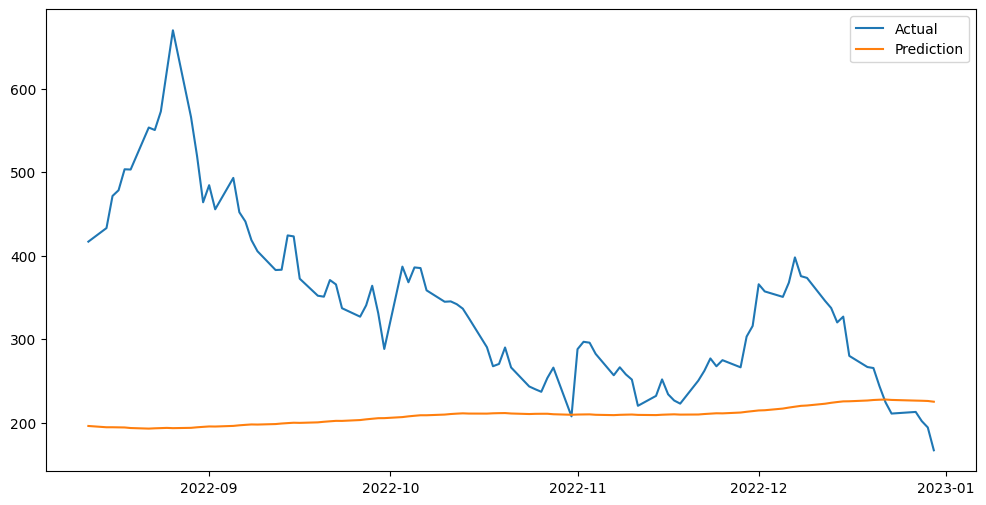

In [19]:
plt.figure(figsize=(12,6))
plt.plot(unknown_data['ds'],unknown_data['y'],label='Actual');
plt.plot(unknown_data['ds'],pred['yhat'],label='Prediction');
plt.legend();

### Removing covid and war

In [20]:
data_ideal = df_price[df_price['ds']<='2019-06-01']

In [21]:
unknown_data_ideal = data_ideal.iloc[-100:]
data_ideal = data_ideal.iloc[:-100]

In [22]:
new_model = Prophet(daily_seasonality=True)
new_model.fit(data_ideal) 

20:23:58 - cmdstanpy - INFO - Chain [1] start processing
20:24:00 - cmdstanpy - INFO - Chain [1] done processing


In [23]:
future_dates = new_model.make_future_dataframe(freq='D', periods=24*30)
predictions = new_model.predict(future_dates)

In [24]:
plot_plotly(new_model,predictions)

In [25]:
pred = predictions[predictions['ds'].isin(unknown_data_ideal['ds'])]

In [26]:
pred

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
3803,2019-01-09,49.059797,47.890826,61.191544,49.059797,49.059797,5.326221,5.326221,5.326221,1.18971,...,0.069589,0.069589,0.069589,4.066922,4.066922,4.066922,0.0,0.0,0.0,54.386018
3804,2019-01-10,49.082337,48.033320,60.389849,49.082337,49.082337,5.228370,5.228370,5.228370,1.18971,...,0.064977,0.064977,0.064977,3.973682,3.973682,3.973682,0.0,0.0,0.0,54.310707
3805,2019-01-11,49.104877,48.128920,60.830532,49.104877,49.104877,5.136411,5.136411,5.136411,1.18971,...,0.068864,0.068864,0.068864,3.877837,3.877837,3.877837,0.0,0.0,0.0,54.241288
3808,2019-01-14,49.172498,47.384279,60.273380,49.172498,49.172498,4.835134,4.835134,4.835134,1.18971,...,0.084473,0.084473,0.084473,3.560951,3.560951,3.560951,0.0,0.0,0.0,54.007632
3809,2019-01-15,49.195038,47.799663,59.853840,49.195038,49.195038,4.640165,4.640165,4.640165,1.18971,...,0.009523,0.009523,0.009523,3.440932,3.440932,3.440932,0.0,0.0,0.0,53.835203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3941,2019-05-27,52.170342,43.015917,56.957946,49.748548,54.231795,-2.521529,-2.521529,-2.521529,1.18971,...,0.084473,0.084473,0.084473,-3.795712,-3.795712,-3.795712,0.0,0.0,0.0,49.648813
3942,2019-05-28,52.192882,42.471227,56.873585,49.731778,54.289197,-2.504204,-2.504204,-2.504204,1.18971,...,0.009523,0.009523,0.009523,-3.703437,-3.703437,-3.703437,0.0,0.0,0.0,49.688678
3943,2019-05-29,52.215422,43.123666,57.450445,49.715846,54.329271,-2.346211,-2.346211,-2.346211,1.18971,...,0.069589,0.069589,0.069589,-3.605510,-3.605510,-3.605510,0.0,0.0,0.0,49.869211
3944,2019-05-30,52.237962,43.020445,57.006694,49.710606,54.373110,-2.247273,-2.247273,-2.247273,1.18971,...,0.064977,0.064977,0.064977,-3.501961,-3.501961,-3.501961,0.0,0.0,0.0,49.990689


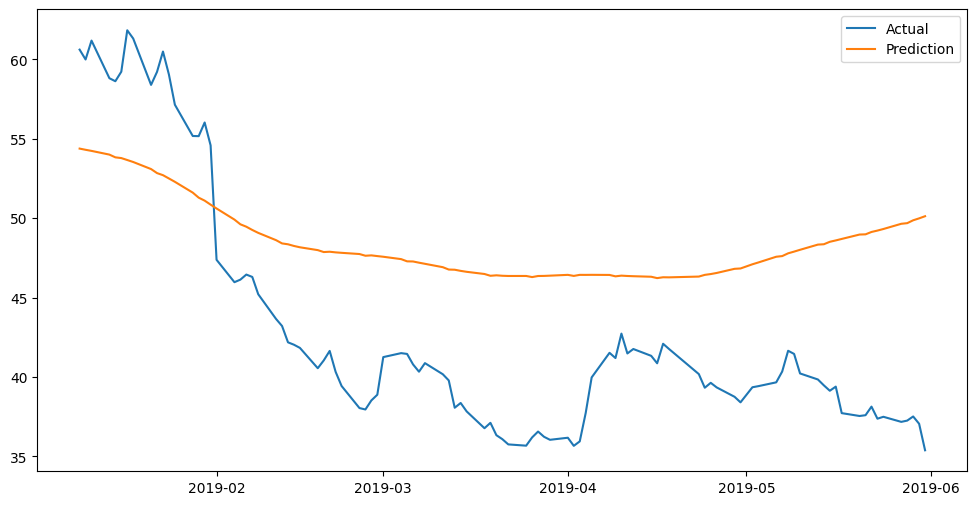

In [27]:
plt.figure(figsize=(12,6))
plt.plot(unknown_data_ideal['ds'],unknown_data_ideal['y'],label='Actual');
plt.plot(unknown_data_ideal['ds'],pred['yhat'],label='Prediction');
plt.legend();

In [28]:
df_cv1 = cross_validation(new_model, period='180 days', horizon='365 days')

  0%|          | 0/25 [00:00<?, ?it/s]

20:24:21 - cmdstanpy - INFO - Chain [1] start processing
20:24:21 - cmdstanpy - INFO - Chain [1] done processing
20:24:21 - cmdstanpy - INFO - Chain [1] start processing
20:24:21 - cmdstanpy - INFO - Chain [1] done processing
20:24:22 - cmdstanpy - INFO - Chain [1] start processing
20:24:22 - cmdstanpy - INFO - Chain [1] done processing
20:24:22 - cmdstanpy - INFO - Chain [1] start processing
20:24:22 - cmdstanpy - INFO - Chain [1] done processing
20:24:22 - cmdstanpy - INFO - Chain [1] start processing
20:24:23 - cmdstanpy - INFO - Chain [1] done processing
20:24:23 - cmdstanpy - INFO - Chain [1] start processing
20:24:23 - cmdstanpy - INFO - Chain [1] done processing
20:24:23 - cmdstanpy - INFO - Chain [1] start processing
20:24:23 - cmdstanpy - INFO - Chain [1] done processing
20:24:23 - cmdstanpy - INFO - Chain [1] start processing
20:24:24 - cmdstanpy - INFO - Chain [1] done processing
20:24:24 - cmdstanpy - INFO - Chain [1] start processing
20:24:24 - cmdstanpy - INFO - Chain [1]

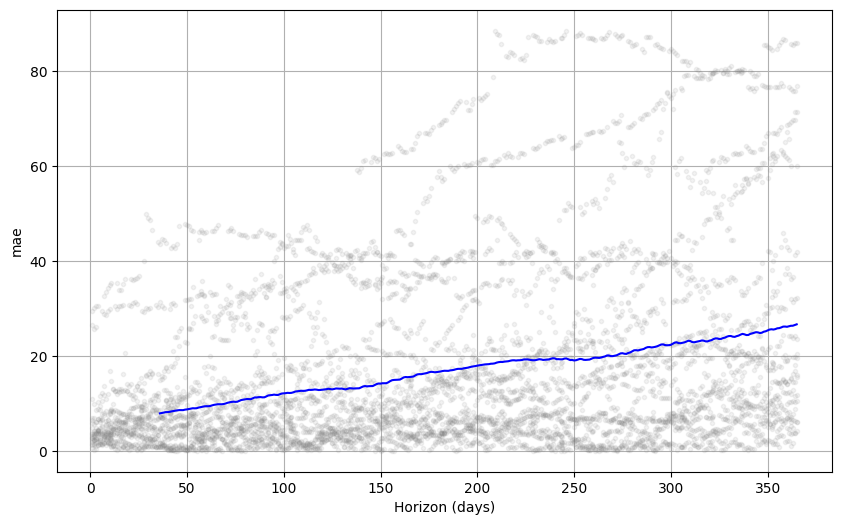

In [29]:
fig = plot_cross_validation_metric(df_cv1, metric='mae')